# Install & Load Package

In [1]:
!pip install scipy==1.11.4
!pip install dalex
!pip install scikit-plot
!pip install shap
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 7.0 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.13.1
    Uninstalling scipy-1.13.1:
      Successfully uninstalled scipy-1.13.1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 13.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for dalex: filename=dalex-1.7.1-py3-none-any.whl size=1042797 sha256=4b5fe104be68d81bb3466ae968a12f133b857098d5754f37150729c2ffd42097
  Stored in directory: /root/.cache/pip/wheels/fe/c2/41/63e006b3312a4e17299bed5f83d985dea872368f9ab16bb20f
Successfully built dalex
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=cfb4fa6f0eb9e79885152808ce40e34d25141265f984fbfc07f59f89aec15a51
  Stored in direc

In [2]:
# import pandas for data wrangling
import pandas as pd
# import numpy for vectorize data manipulation
import numpy as np
# import matplotlib.pyplot module for data visualization
import matplotlib.pyplot as plt
# import seaborn for data visualization
import seaborn as sns
# import scipy for certain statistical function
from scipy import stats

# import train and test split method from scikit-learn
from sklearn.model_selection import train_test_split
# import metrics method for model evaluation
import sklearn.metrics as metrics
# import random forest classifier
from sklearn.ensemble import RandomForestClassifier
# import multi-layer perceptron
from sklearn.neural_network import MLPClassifier
# import decision tree model as surrogate model
from sklearn.tree import DecisionTreeClassifier
# import tree module
from sklearn import tree

# import xgboost classifier
from xgboost import XGBClassifier

# import dalex to explain complex model
import dalex as dx

# load scikit-plot modules
import scikitplot as skplt

# load shap package for shap explanation
import shap

# load LimeTabularExplainer for LIME method
from lime.lime_tabular import LimeTabularExplainer

# Load Dataset

In [3]:
# load customer churn dataset
data = pd.read_csv('/content/bank_churn_data.csv')

In [4]:
# check the first 5 data frim churn_data
data.head()

,user_id,attrition_flag,customer_age,gender,dependent_count,education_level,marital_status,income_category,card_category,months_on_book,...,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


# Data Inspection

In [6]:
# check churn_data data structure and its types
data.dtypes

,0
user_id,int64
attrition_flag,object
customer_age,int64
gender,object
dependent_count,int64
education_level,object
marital_status,object
income_category,object
card_category,object
months_on_book,int64


In [8]:
# check data dimension
data.shape

(10127, 21)

In [9]:
# check null values inside dataset
data.isna().sum()

,0
user_id,0
attrition_flag,0
customer_age,0
gender,0
dependent_count,0
education_level,0
marital_status,0
income_category,0
card_category,0
months_on_book,0


In [10]:
# removes row with na values
data = data.dropna()

In [11]:
# check dimension and null values inside dataset
print("Dimension of data: {}".format(data.shape))
print("Number of null values:")
data.isna().sum()

Dimension of data: (10127, 21)
Number of null values:


,0
user_id,0
attrition_flag,0
customer_age,0
gender,0
dependent_count,0
education_level,0
marital_status,0
income_category,0
card_category,0
months_on_book,0


In [13]:
# drop custid column
data = data.drop(['user_id'], axis = 1)

# Simple EDA

<Axes: xlabel='attrition_flag'>

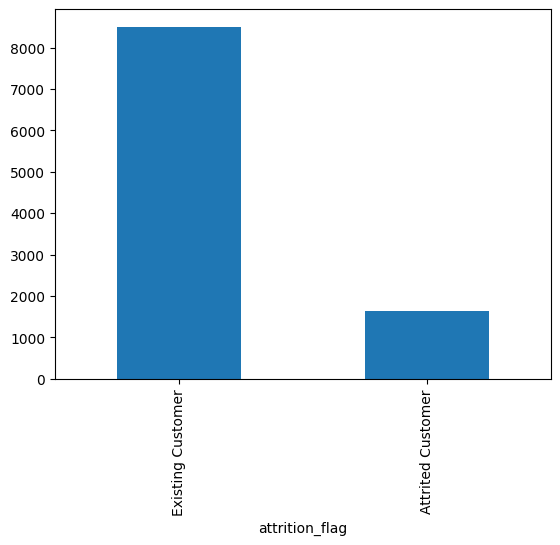

In [14]:
data['attrition_flag'].value_counts().plot(kind = 'bar')

In [16]:
# check churn_data structure
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   attrition_flag            10127 non-null  object 
 1   customer_age              10127 non-null  int64  
 2   gender                    10127 non-null  object 
 3   dependent_count           10127 non-null  int64  
 4   education_level           10127 non-null  object 
 5   marital_status            10127 non-null  object 
 6   income_category           10127 non-null  object 
 7   card_category             10127 non-null  object 
 8   months_on_book            10127 non-null  int64  
 9   total_relationship_count  10127 non-null  int64  
 10  months_inactive_12_mon    10127 non-null  int64  
 11  contacts_count_12_mon     10127 non-null  int64  
 12  credit_limit              10127 non-null  float64
 13  total_revolving_bal       10127 non-null  int64  
 14  avg_op

In [19]:
data.head()

,attrition_flag,customer_age,gender,dependent_count,education_level,marital_status,income_category,card_category,months_on_book,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [20]:
# check data
data.head()

,attrition_flag,customer_age,gender,dependent_count,education_level,marital_status,income_category,card_category,months_on_book,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


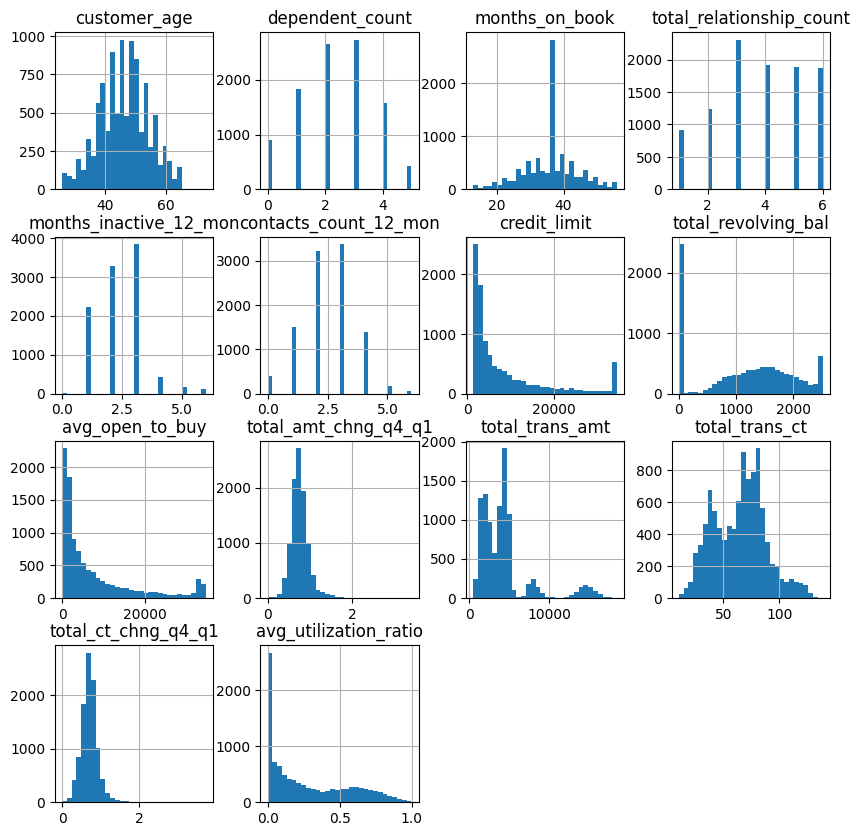

In [21]:
# check numerical data distribution
data.hist(bins=30, figsize = (10, 10));

In [22]:
# feature engineering ; Avg_Transaction_Value
data['Avg_Transaction_Value'] = data['total_trans_amt'] / data['total_trans_ct']

In [23]:
# feature engineering ;  Credit_Limit_Utilization
data['Credit_Limit_Utilization'] = data['total_revolving_bal'] / data['credit_limit']

In [24]:
categorical_features = ['gender', 'education_level', 'marital_status', 'income_category', 'card_category']
data = pd.get_dummies(data, columns=categorical_features, drop_first=True) # drop_first untuk menghindari multicollinearity

In [25]:
# check the first 5 rows
data.head()

,attrition_flag,customer_age,dependent_count,months_on_book,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,...,marital_status_Single,marital_status_Unknown,income_category_$40K - $60K,income_category_$60K - $80K,income_category_$80K - $120K,income_category_Less than $40K,income_category_Unknown,card_category_Gold,card_category_Platinum,card_category_Silver
0,Existing Customer,45,3,39,5,1,3,12691.0,777,11914.0,...,False,False,False,True,False,False,False,False,False,False
1,Existing Customer,49,5,44,6,1,2,8256.0,864,7392.0,...,True,False,False,False,False,True,False,False,False,False
2,Existing Customer,51,3,36,4,1,0,3418.0,0,3418.0,...,False,False,False,False,True,False,False,False,False,False
3,Existing Customer,40,4,34,3,4,1,3313.0,2517,796.0,...,False,True,False,False,False,True,False,False,False,False
4,Existing Customer,40,3,21,5,1,0,4716.0,0,4716.0,...,False,False,False,True,False,False,False,False,False,False


# Train-Test Split

In [26]:
X = data.drop(['attrition_flag'], axis = 1)
y = data['attrition_flag']

In [27]:
# split data to train and test data
# where 30% of churn_data are test data
# stratify data based on y varibales
# and freeze RNG with random_state = 1000
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.3,
    stratify = y,
    random_state=1000
)

In [28]:
# check train data dimension
X_train.shape

(7088, 34)

In [29]:
# check test data dimension
X_test.shape

(3039, 34)

In [30]:
# check train target counts
y_train.value_counts()

,count
attrition_flag,
Existing Customer,5949
Attrited Customer,1139


In [31]:
# check test target counts
y_test.value_counts()

,count
attrition_flag,
Existing Customer,2551
Attrited Customer,488


# Exploratory Data Analysis

In [32]:
# create correlation matrix
X_train.corr().style.background_gradient(cmap='coolwarm')

,customer_age,dependent_count,months_on_book,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio,Avg_Transaction_Value,Credit_Limit_Utilization,gender_M,education_level_Doctorate,education_level_Graduate,education_level_High School,education_level_Post-Graduate,education_level_Uneducated,education_level_Unknown,marital_status_Married,marital_status_Single,marital_status_Unknown,income_category_$40K - $60K,income_category_$60K - $80K,income_category_$80K - $120K,income_category_Less than $40K,income_category_Unknown,card_category_Gold,card_category_Platinum,card_category_Silver
customer_age,1.000000,-0.117311,0.782930,-0.012722,0.052371,-0.019628,0.001609,0.012763,0.000460,-0.064080,-0.048100,-0.065565,-0.011134,0.009735,-0.034106,0.009745,-0.018311,0.018609,0.006492,0.003794,-0.020384,0.005524,0.004928,0.039657,-0.003725,-0.028934,-0.008262,-0.019940,0.001708,-0.005831,0.001640,-0.017786,0.008480,-0.018955
dependent_count,-0.117311,1.000000,-0.101241,-0.039209,-0.015641,-0.039332,0.068294,-0.000507,0.068340,-0.041105,0.025677,0.055984,0.011887,-0.036118,0.013827,-0.036099,0.011606,-0.002470,-0.015249,0.000506,0.015352,0.001594,0.005351,0.020077,-0.049362,0.047223,-0.004837,0.030677,0.053778,-0.058282,-0.020936,0.028955,0.002059,0.016160
months_on_book,0.782930,-0.101241,1.000000,-0.014522,0.069557,-0.011949,0.004570,0.009782,0.003689,-0.049046,-0.037276,-0.046676,-0.009942,0.001216,-0.027777,0.001222,-0.010740,0.014754,0.012456,0.003481,-0.019479,0.001496,-0.001229,0.024779,0.002878,-0.024272,0.000753,-0.019070,0.000475,-0.001457,-0.006062,-0.011216,0.005141,-0.019013
total_relationship_count,-0.012722,-0.039209,-0.014522,1.000000,-0.002367,0.056281,-0.073234,0.010419,-0.074173,0.054441,-0.355116,-0.252051,0.035474,0.061846,-0.349924,0.061843,0.005419,-0.006968,-0.000615,0.009466,0.009071,-0.003069,0.002297,0.012081,-0.013067,-0.008437,-0.003019,0.008902,-0.008653,-0.004819,0.010040,-0.054809,-0.048226,-0.075731
months_inactive_12_mon,0.052371,-0.015641,0.069557,-0.002367,1.000000,0.034635,-0.024306,-0.047054,-0.020069,-0.039867,-0.036689,-0.044868,-0.043507,-0.003179,-0.015183,-0.003175,-0.004102,-0.001087,0.006027,-0.014769,-0.009500,0.003918,0.002113,-0.004581,0.006065,-0.011833,-0.025242,0.000932,-0.003148,0.010976,0.020686,-0.009562,-0.012465,-0.013610
contacts_count_12_mon,-0.019628,-0.039332,-0.011949,0.056281,0.034635,1.000000,0.023557,-0.059780,0.028941,-0.023478,-0.118590,-0.161729,-0.094879,-0.059437,-0.075745,-0.059440,0.046064,-0.003281,0.009036,-0.020215,-0.010772,0.009025,0.001853,0.008174,0.002930,-0.015444,0.000964,0.004685,0.014493,-0.030270,0.005605,-0.004010,0.008680,-0.011175
credit_limit,0.001609,0.068294,0.004570,-0.073234,-0.024306,0.023557,1.000000,0.045217,0.995945,0.017528,0.173966,0.078985,-0.008991,-0.477813,0.180499,-0.477821,0.412258,0.011224,-0.015281,-0.010083,0.011344,0.011983,-0.006564,-0.057891,0.033510,0.023748,-0.157584,0.077325,0.331645,-0.389028,0.031987,0.229776,0.103678,0.435583
total_revolving_bal,0.012763,-0.000507,0.009782,0.010419,-0.047054,-0.059780,0.045217,1.000000,-0.044835,0.059118,0.080573,0.073048,0.101141,0.624437,0.047382,0.624429,0.027842,-0.012423,-0.006574,0.020347,0.006822,-0.005640,0.004186,0.042298,-0.048921,-0.000270,0.004425,-0.003971,0.023649,-0.015206,-0.018094,0.020754,-0.002449,0.008932
avg_open_to_buy,0.000460,0.068340,0.003689,-0.074173,-0.020069,0.028941,0.995945,-0.044835,1.000000,0.012204,0.166713,0.072408,-0.018099,-0.534054,0.176235,-0.534061,0.409758,0.012343,-0.014689,-0.011916,0.010730,0.012491,-0.006941,-0.061701,0.037917,0.023773,-0.157985,0.077684,0.329521,-0.387665,0.033617,0.227911,0.103900,0.434786
total_amt_chng_q4_q1,-0.064080,-0.041105,-0.049046,0.054441,-0.039867,-0.023478,0.017528,0.059118,0.012204,1.000000,0.036171,0.000083,0.373829,0.030845,0.078496,0.030831,0.026198,-0.015698,-0.

In [33]:
column_to_drop = ['Avg_Transaction_Value', 'Credit_Limit_Utilization']
X_train = X_train.drop(column_to_drop, axis = 1)
X_test = X_test.drop(column_to_drop, axis = 1)

In [34]:
var_name = X_train.select_dtypes(include = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']).columns

In [35]:
var_name

Index(['customer_age', 'dependent_count', 'months_on_book',
       'total_relationship_count', 'months_inactive_12_mon',
       'contacts_count_12_mon', 'credit_limit', 'total_revolving_bal',
       'avg_open_to_buy', 'total_amt_chng_q4_q1', 'total_trans_amt',
       'total_trans_ct', 'total_ct_chng_q4_q1', 'avg_utilization_ratio'],
      dtype='object')

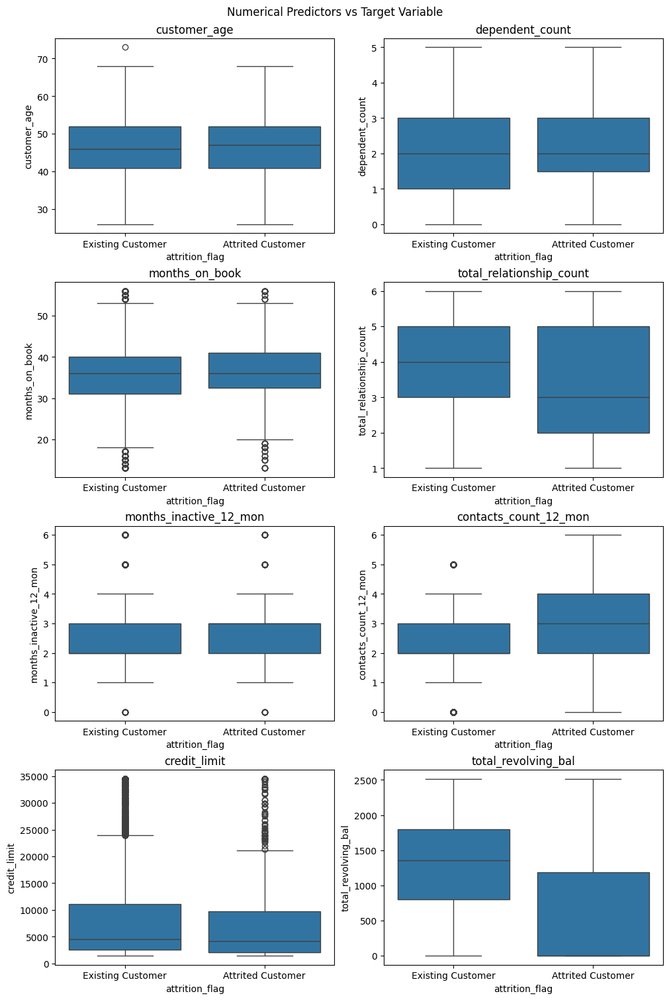

In [38]:
fig, axes = plt.subplots(4,2, sharex=False, sharey = False, figsize=(10,15), constrained_layout = True)

fig.suptitle('Numerical Predictors vs Target Variable')

col_index = 0  # Initialize col_index before the loop

for row in range(4):
  for col in range(2):
    sns.boxplot(ax = axes[row,col], x=y_train, y = X_train[var_name[col_index]])
    axes[row,col].set_title(var_name[col_index])
    # axes[row,col].xticks(color='w')
    col_index += 1

# Modeling

**Random Forest Model**
```python
sklearn.ensemble.RandomForestClassifier(n_estimators=100, *, criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto', max_leaf_nodes=None, min_impurity_decrease=0.0, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, class_weight=None, ccp_alpha=0.0, max_samples=None)
```
For further explanation, check: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

In [39]:
# define random forest model
random_forest_clf = RandomForestClassifier(
    random_state = 1000,
    n_estimators=100
)
# fit model to training data
random_forest_clf.fit(X_train, y_train)

RandomForestClassifier(random_state=1000)

**Multi-Layered Perceptron**
```python
sklearn.neural_network.MLPClassifier(hidden_layer_sizes=(100,), activation='relu', *, solver='adam', alpha=0.0001, batch_size='auto', learning_rate='constant', learning_rate_init=0.001, power_t=0.5, max_iter=200, shuffle=True, random_state=None, tol=0.0001, verbose=False, warm_start=False, momentum=0.9, nesterovs_momentum=True, early_stopping=False, validation_fraction=0.1, beta_1=0.9, beta_2=0.999, epsilon=1e-08, n_iter_no_change=10, max_fun=15000)
```
For further explanation, check: https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html

In [40]:
mlp_clf = MLPClassifier(
    random_state = 1000,
    hidden_layer_sizes = (8,),
    solver = 'sgd'
)

# fit model to training data
mlp_clf.fit(X_train, y_train)

MLPClassifier(hidden_layer_sizes=(8,), random_state=1000, solver='sgd')

**XGBoost Classifier**
```python
xgboost.XGBClassifier(*, objective='binary:logistic', use_label_encoder=True, **kwargs)
```
For further explanation, check: https://xgboost.readthedocs.io/en/stable/python/python_api.html

In [42]:
from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder object
le = LabelEncoder()

# Fit the encoder to your target variable and transform it
y_train = le.fit_transform(y_train)
y_test = le.fit_transform(y_test)

# Now you can fit the XGBoost model
xgb_clf = XGBClassifier(random_state=1000)
xgb_clf.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=1000, ...)

In [43]:
# fit model no training data
xgb_clf = XGBClassifier(
    random_state = 1000
)

xgb_clf.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=1000, ...)

In [44]:
xgb_clf

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=1000, ...)

# Model Evaluation

In [45]:
# random forest prediction
rf_pred = random_forest_clf.predict(X_test)
rf_pred_proba = random_forest_clf.predict_proba(X_test)

# multi-layered perceptron prediction
mlp_pred = mlp_clf.predict(X_test)
mlp_pred_proba = mlp_clf.predict_proba(X_test)

# XGBoost prediction
xgb_pred = xgb_clf.predict(X_test)
xgb_pred_proba = xgb_clf.predict_proba(X_test)

**Classification Report**

In [47]:
rf_pred = le.transform(rf_pred)

pd.DataFrame(metrics.classification_report(y_test, rf_pred, target_names=['0','1'], output_dict=True))

,0,1,accuracy,macro avg,weighted avg
precision,0.919431,0.961788,0.955907,0.940610,0.954987
recall,0.795082,0.986672,0.955907,0.890877,0.955907
f1-score,0.852747,0.974071,0.955907,0.913409,0.954589
support,488.000000,2551.000000,0.955907,3039.000000,3039.000000


In [61]:
pd.DataFrame(metrics.classification_report(y_test, mlp_pred, target_names=['0','1'], output_dict=True))

ValueError: Mix of label input types (string and number)

In [56]:
# XGBoost prediction result
pd.DataFrame(metrics.classification_report(y_test, xgb_pred, target_names=['0','1'], output_dict=True))

,0,1,accuracy,macro avg,weighted avg
precision,0.941432,0.979054,0.973346,0.960243,0.973012
recall,0.889344,0.989416,0.973346,0.939380,0.973346
f1-score,0.914647,0.984207,0.973346,0.949427,0.973037
support,488.000000,2551.000000,0.973346,3039.000000,3039.000000


**Confusion Matrix**

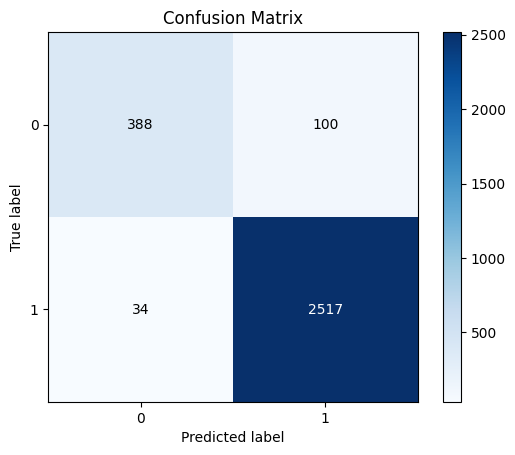

In [62]:
# random forest result
skplt.metrics.plot_confusion_matrix(y_test, rf_pred);

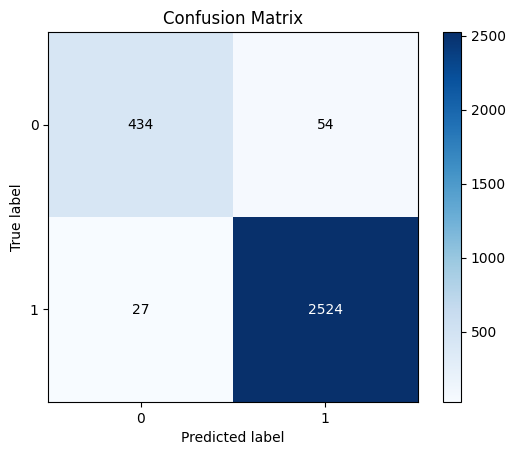

In [64]:
# xgboost result
skplt.metrics.plot_confusion_matrix(y_test, xgb_pred);

**ROC-AUC**

/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.
  warnings.warn(msg, category=FutureWarning)


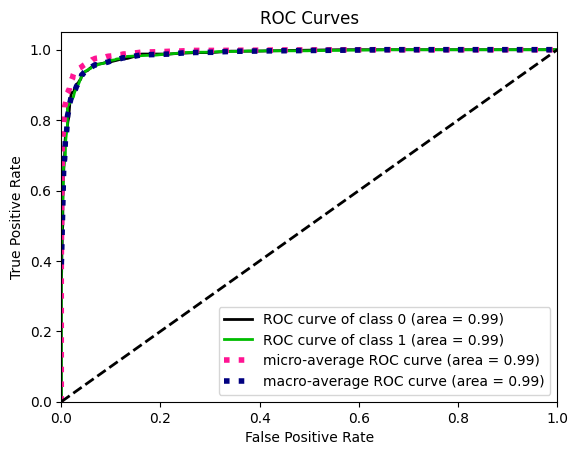

In [65]:
# random forest result
skplt.metrics.plot_roc_curve(y_test, rf_pred_proba);

/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.
  warnings.warn(msg, category=FutureWarning)


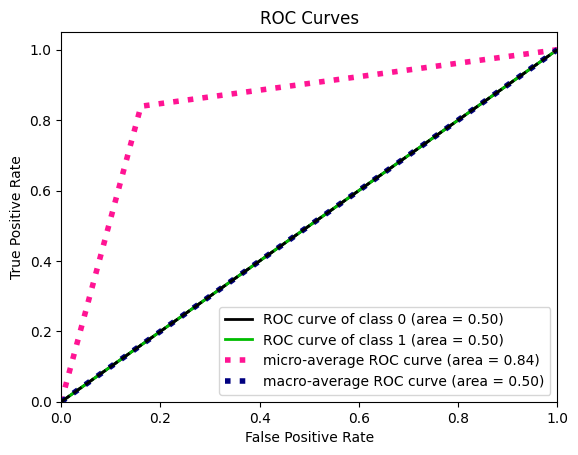

In [66]:
# multi-layered perceptron result
skplt.metrics.plot_roc_curve(y_test, mlp_pred_proba);

/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.
  warnings.warn(msg, category=FutureWarning)


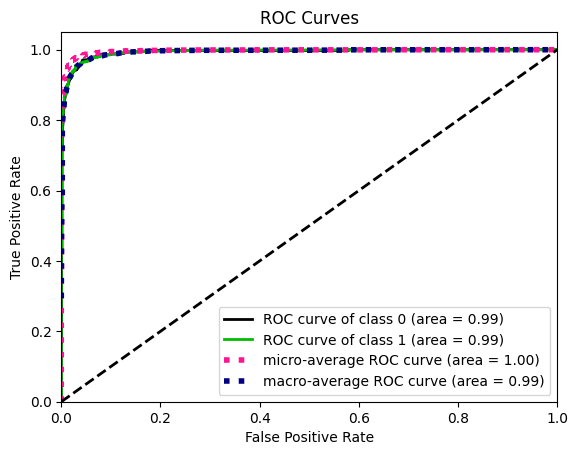

In [67]:
# xgboost result
skplt.metrics.plot_roc_curve(y_test, xgb_pred_proba);

# Model Agnostic Methods

In [68]:
# Inititate Explainer for all models

## initiate explainer for Random Forest model
churn_rf_exp = dx.Explainer(random_forest_clf, X_train, y_train, label = "RF Interpretation")
## initiate explainer for MLP model
churn_mlp_exp = dx.Explainer(mlp_clf, X_train, y_train, label = "MLP Interpretation")
## initiate explainer for XGBoost model
churn_xgb_exp = dx.Explainer(xgb_clf, X_train, y_train, label = "XGBoost Interpretation")

Preparation of a new explainer is initiated

  -> data              : 7088 rows 32 cols
  -> target variable   : 7088 values
  -> model_class       : sklearn.ensemble._forest.RandomForestClassifier (default)
  -> label             : RF Interpretation
  -> predict function  : <function yhat_proba_default at 0x7c05060bc3a0> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.0, mean = 0.84, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.41, mean = -0.00101, max = 0.34
  -> model_info        : package sklearn

A new explainer has been created!
Preparation of a new explainer is initiated

  -> data              : 7088 rows 32 cols
  -> target variable   : 7088 values
  -> model_class       : sklearn.neural_network._multilayer_perceptron.MLPClassifier (default)
  -> label             : MLP Interp

## Feature Importance

In [69]:
# visualizr permutation feature importance for Random Forest Model
churn_rf_exp.model_parts().plot()

In [70]:
# visualize permutation feature importance for MLP model
churn_mlp_exp.model_parts().plot()

In [71]:
# visualize permutation feature importance for XGBoost model
churn_xgb_exp.model_parts().plot()

## Partial Dependence Plot

In [72]:
# create partial dependence plot of Random Forest model
churn_rf_exp.model_profile().plot()

Calculating ceteris paribus:   0%|          | 0/32 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:100: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[26.   26.47 26.94 ... 72.06 72.53 73.  ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

Calculating ceteris paribus:   3%|▎         | 1/32 [00:00<00:08,  3.73it/s]/usr/local/lib/python3.10/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:100: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.   0.05 0.1  ... 4.9  4.95 5.  ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

Calculating ceteris paribus:   6%|▋         | 2/32 [00:00<00:08,  3.64it/s]/usr/local/lib/python3.10/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:

In [73]:
# create partial dependence plot of MLP model
churn_mlp_exp.model_profile().plot()

Calculating ceteris paribus:   0%|          | 0/32 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:100: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[26.   26.47 26.94 ... 72.06 72.53 73.  ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/usr/local/lib/python3.10/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:100: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.   0.05 0.1  ... 4.9  4.95 5.  ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/usr/local/lib/python3.10/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:100: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[13.   13.43 13.86 ... 55.

In [74]:
# create partial dependence plot of XGBoost model
churn_xgb_exp.model_profile().plot()

Calculating ceteris paribus:   0%|          | 0/32 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:100: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[26.   26.47 26.94 ... 72.06 72.53 73.  ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/usr/local/lib/python3.10/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:100: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.   0.05 0.1  ... 4.9  4.95 5.  ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

Calculating ceteris paribus:   6%|▋         | 2/32 [00:00<00:02, 11.42it/s]/usr/local/lib/python3.10/dist-packages/dalex/predict_explanations/_ceteris_paribus/utils.py:100: FutureWarning:

Setting an item of incompatible dtype is deprecated an

## Shapley Value and Shapley Additive Explanations

### Dataset Level Explanation

**Random Forest Model**

In [75]:
# create sample used for developing shapley
data_for_shapley = X_train.sample(n = 1000, random_state = 1000)

In [76]:
# create SHAP Tree Explainer for random forest model with first 1000 rows of train data
rf_shap_values = shap.TreeExplainer(random_forest_clf).shap_values(data_for_shapley)

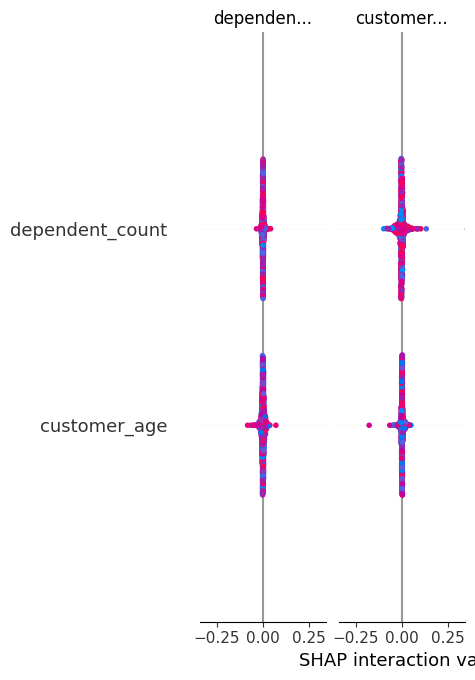

In [77]:
# create SHAP summary plot with next 1000 rows of train data
shap.summary_plot(rf_shap_values, X_train[1000:2000], plot_type='bar')

**XGBoost Model**

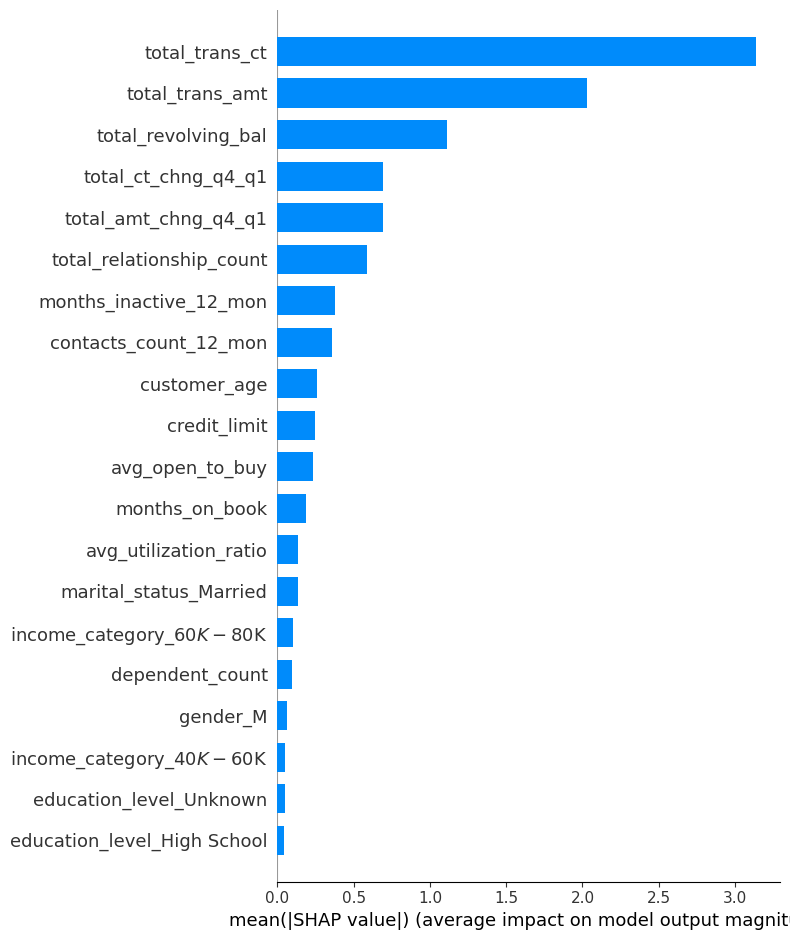

In [78]:
# create SHAP Tree Explainer for XGBoost model with| first 1000 rows of train data
xgb_shap_values = shap.TreeExplainer(xgb_clf).shap_values(X_train[:1000])

# create SHAP summary plot with next 1000 rows of train data
shap.summary_plot(xgb_shap_values, X_train[1000:2000], plot_type='bar')

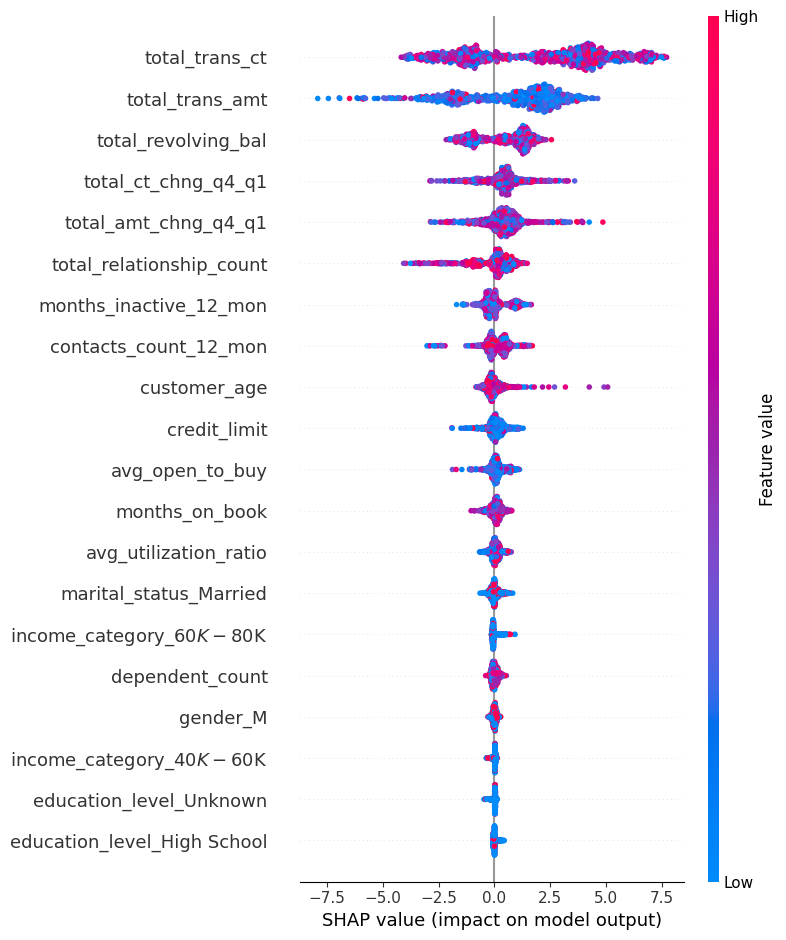

In [79]:
# create SHAP summary plot to visualize impact distribution of next 1000 rows of train data
shap.summary_plot(xgb_shap_values, X_train[1000:2000])

**Multi-Layered Perceptron**

In [81]:
f = lambda x: mlp_clf.predict_proba(x)[:,1]
# create median
med = X_train.median().values.reshape((1,X_train.shape[1])).astype(float) # convert med to float array

# create explainer for MLP model
mlp_explainer = shap.Explainer(f, med)
# implement SHAP method for MLP model
mlp_shap_values = mlp_explainer(X_train[:1000].astype(float)) # Ensure X_train is a float array

Output streaming akan dipotong hingga 5000 baris terakhir.
X does not have valid feature names, but MLPClassifier was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but MLPClassifier was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but MLPClassifier was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but MLPClassifier was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but MLPClassifier was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but MLPClassifier was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/ba

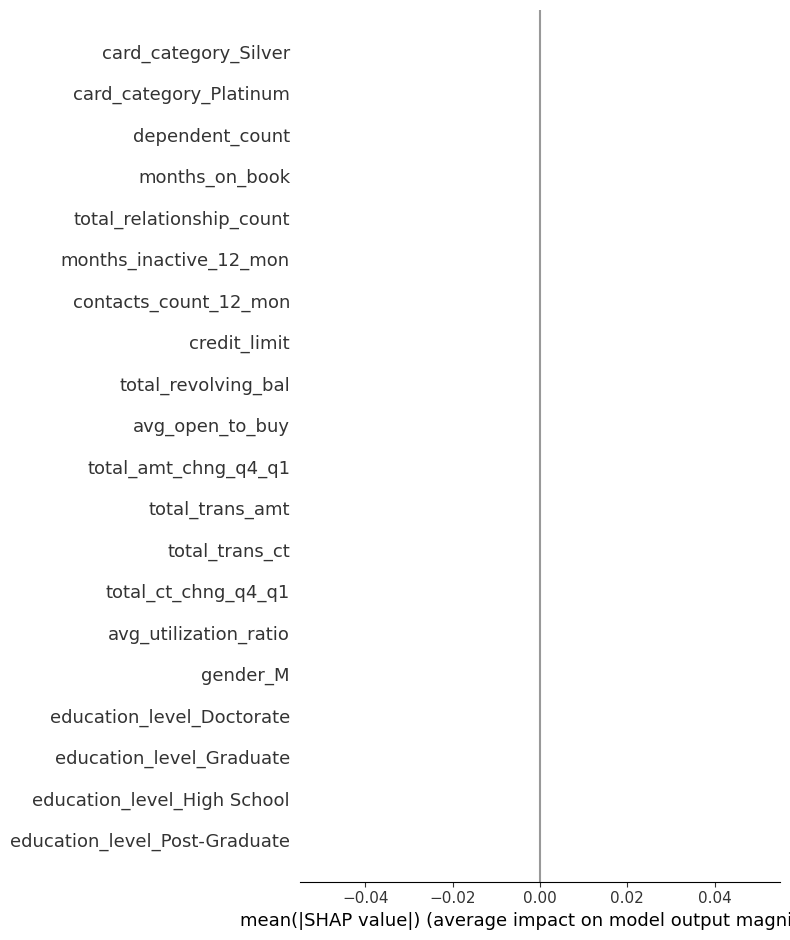

In [82]:
# create SHAP summary plot to visualize impact of next 1000 rows of train data
shap.summary_plot(mlp_shap_values, X_train[1001:2000], plot_type='bar')

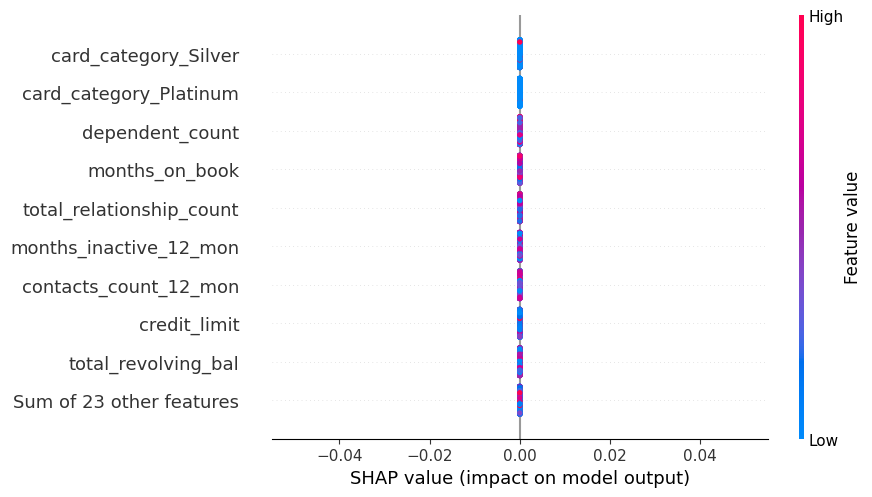

In [83]:
# create SHAP summary plot to visualize impact distribution
shap.plots.beeswarm(mlp_shap_values)

### Instance Level

In [84]:
# initiate javascript module
shap.initjs()

In [85]:
# check data for row 1
X_train.iloc[1,:]

,8757
customer_age,50
dependent_count,4
months_on_book,41
total_relationship_count,4
months_inactive_12_mon,3
contacts_count_12_mon,3
credit_limit,6982.0
total_revolving_bal,0
avg_open_to_buy,6982.0
total_amt_chng_q4_q1,1.018


In [86]:
# check target for row 1
y_train[1]

0

In [87]:
xgb_pred[1]

1

**XGBoost Model**

In [88]:
# create SHAP Tree Explainer for XGBoost model with all rows of train data
xgb_explainer = shap.TreeExplainer(xgb_clf)
# create shap values from xgb_explainer
xgb_shap_values = xgb_explainer.shap_values(X_train)

In [89]:
# initiate javascript module
shap.initjs()

# explain prediction for the first row of X_train
shap.force_plot(xgb_explainer.expected_value, xgb_shap_values[1,:], X_train.iloc[1,:])

In [90]:
# initiate javascript module
shap.initjs()

# explain prediction for the first row of X_train
shap.force_plot(xgb_explainer.expected_value, xgb_shap_values[:1000,:], X_train.iloc[:1000,:])

## Local Interpretable Model-Agnostic Explanation

In [91]:
# define Random Forest explainer with lime module
lime_explainer = LimeTabularExplainer(
    X_train.values,
    feature_names = X_train.columns.tolist(),
    class_names = ['churn', 'retained'],
    discretize_continuous = True,
    verbose = True
)

In [92]:
user_id_23976 = X_train.iloc[0]
user_id_23976

,2191
customer_age,33
dependent_count,1
months_on_book,36
total_relationship_count,4
months_inactive_12_mon,3
contacts_count_12_mon,2
credit_limit,2946.0
total_revolving_bal,1359
avg_open_to_buy,1587.0
total_amt_chng_q4_q1,0.746


In [93]:
rf_pred[0]

1

In [94]:
# explain Random Forest prediction for user_id: 23976
lime_explainer.explain_instance(user_id_23976, random_forest_clf.predict_proba).show_in_notebook(show_table=True)

/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/usr/local/lib/python3.10/dist-packages/lime/lime_tabular.py:544: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning:

X does not have valid fe

Intercept 0.7272668672501671
Prediction_local [0.75759584]
Right: 0.95


In [95]:
mlp_pred[0]

'Existing Customer'

In [96]:
y_train[0]

1

In [97]:
# explain Random Forest prediction for user_id: 23976
lime_explainer.explain_instance(user_id_23976, mlp_clf.predict_proba).show_in_notebook(show_table=True)

Intercept 0.8297440932919748
Prediction_local [0.83081968]
Right: 0.8302649583022546


/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/usr/local/lib/python3.10/dist-packages/lime/lime_tabular.py:544: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning:

X does not have valid fe

In [98]:
xgb_pred[0]

1

In [99]:
# explain Random Forest prediction for user_id: 23976 (sometimes error)
lime_explainer.explain_instance(user_id_23976, xgb_clf.predict_proba).show_in_notebook(show_table=True)

Intercept 0.7399601472509467
Prediction_local [0.873758]
Right: 0.99933976


/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

/usr/local/lib/python3.10/dist-packages/lime/lime_tabular.py:544: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning:

Series.__getitem__ 